In [1]:
import torch
from ase.io import read
from mattersim.forcefield import MatterSimCalculator
from sklearn.metrics import mean_absolute_error
import wandb
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from mattersim.forcefield.m3gnet.m3gnet import M3Gnet
	

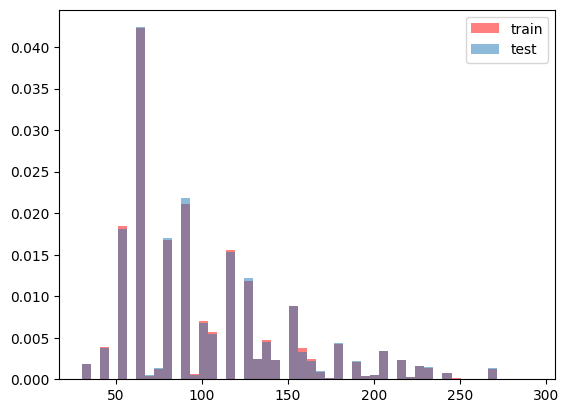

In [2]:
masses = {
    "H": 1.008,
    "C": 12.011,
}

def parse_molecules(path):
    weights = []
    with open(path) as f:
        while True:
            line = f.readline()
            if not line:
                break
            line = line.strip()
            if not line.isdigit():
                continue
            n_atoms = int(line)

            f.readline()
            mol_mass = 0
            for _ in range(n_atoms):
                parts = f.readline().split()
                elem = parts[0]
                mol_mass += masses[elem]

            weights.append(mol_mass)
    return weights

train_w = parse_molecules("/Users/bug9g/Datasets and Weights/train.xyz")
test_w = parse_molecules("/Users/bug9g/Datasets and Weights/test.xyz") + parse_molecules("/Users/bug9g/Datasets and Weights/val.xyz")
plt.hist(train_w, bins=50, alpha=0.5, label="train", color='red', density=True)
plt.hist(test_w, bins=50, alpha=0.5, label="test", density=True)
plt.legend()
plt.show()

In [3]:
def plot_inverse_density(masses):

    masses = np.array(masses)

    kde = gaussian_kde(masses)
    xs = np.linspace(min(masses), 250)
    density = kde(xs)

    inv_density = 1 / density

    inv_density_norm = inv_density / np.mean(inv_density)
    inv_density_norm = np.clip(inv_density_norm, 0, 250)
    plt.plot(xs, inv_density_norm)
    plt.xlabel("Mass")
    plt.ylabel("Inverse density")
    plt.title("Inverse density")
    plt.grid(True)
    plt.show()

    min_val = masses.min()
    max_val = masses.max()
    num_bins = 50

    bin_width = (max_val - min_val) / num_bins
    print("Bin width:", bin_width)

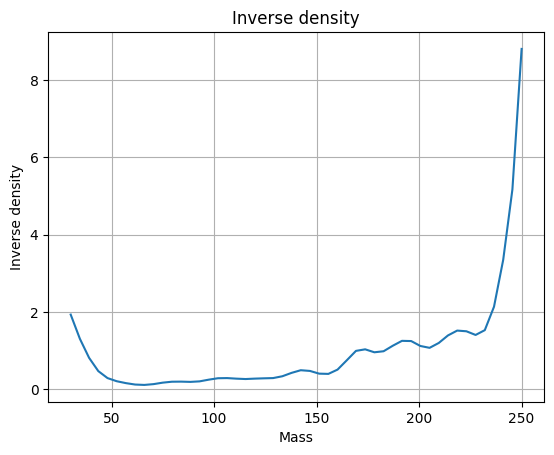

Bin width: 5.246220000000003


In [4]:
plot_inverse_density(test_w)

### Взвешенная функция потерь (Weighted MSE)

Формула среднеквадратичной ошибки с учетом весов молекул:

$$ \mathcal{L}_{\text{weighted}} = \frac{1}{N} \sum_{i=1}^{N} w(M_i) \cdot \left( y_i - \hat{y}_i \right)^2 $$

Где весовая функция $w(M_i)$ зависит от молекулярной массы $M_i$:

$$ w(M_i) = \begin{cases} 
3.0, & \text{если } M_i < 50 \\ 
1.0, & \text{если } 50 \le M_i < 100 \\ 
1.5, & \text{если } 100 \le M_i \le 175 \\ 
3.0, & \text{если } M_i > 175 
\end{cases} $$

* **$N$** — количество объектов (молекул) в выборке.
* **$y_i$** — истинное значение.
* **$\hat{y}_i$** — предсказанное значение.
* **$M_i$** — масса $i$-й молекулы.



In [10]:
import os
os.environ["MASTER_ADDR"] = "localhost"
os.environ["MASTER_PORT"] = "12355"
os.environ["LOCAL_RANK"] = "0"
os.environ["RANK"] = "0"
os.environ["WORLD_SIZE"] = "1"

!python -m mattersim.training.finetune_mattersim \
  --run_name test_cpu \
  --train_data_path /Users/bug9g/Datasets_and_Weights/train.xyz \
  --valid_data_path /Users/bug9g/Datasets_and_Weights/test.xyz \
  --load_model_path /Users/bug9g/Libraries/mattersim/pretrained_models/mattersim-v1.0.0-5M.pth \
  --device cpu \
  --batch_size 4 \
  --epochs 1 \
  --no-include_forces \
  --no-include_stresses

2025-12-08 17:17:26.831 | INFO     | __main__:main:65 - Processing training datasets...
/opt/homebrew/Caskroom/miniforge/base/envs/mattersim/lib/python3.9/site-packages/mattersim/datasets/utils/convertor.py:210: UserWarning: No PBC detected, using a large supercell with size 33.819199999999995x33.819199999999995x33.819199999999995 Angstrom**3
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mattersim/lib/python3.9/site-packages/mattersim/datasets/utils/convertor.py:210: UserWarning: No PBC detected, using a large supercell with size 29.1x29.1x29.1 Angstrom**3
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mattersim/lib/python3.9/site-packages/mattersim/datasets/utils/convertor.py:210: UserWarning: No PBC detected, using a large supercell with size 32.5207x32.5207x32.5207 Angstrom**3
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mattersim/lib/python3.9/site-packages/mattersim/datasets/utils/convertor.py:210: UserWarning: No PBC detected, using a lar